<a href="https://colab.research.google.com/github/Mohamed66Adel/Datascience/blob/main/EDA_Traffic_crash.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Load Data

In [114]:
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))

Saving traffic_crashes.csv to traffic_crashes (1).csv
User uploaded file "traffic_crashes (1).csv" with length 21248 bytes


In [115]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [116]:
df = pd.read_csv('traffic_crashes.csv')
df.head()

,Quarter,State,Total_Crashes,Num_Injured,Num_Killed,Total_Vehicles_Involved,SPV,DAD,PWR,FTQ,Other_Factors
0,Q4 2020,Abia,30,146,31,37,19,0,0,0,18
1,Q4 2020,Adamawa,77,234,36,94,57,0,0,0,37
2,Q4 2020,Akwa Ibom,22,28,7,24,15,0,0,1,8
3,Q4 2020,Anambra,72,152,20,83,43,1,0,0,39
4,Q4 2020,Bauchi,154,685,90,140,74,0,0,0,66


Here Factors are (SPV,	DAD,	PWR,	FTQ,	Other_Factors),\
Results are (Total_Crashes,	Num_Injured,	Num_Killed,	Total_Vehicles_Involved)

## general information about Data

In [117]:
print(df.shape)
df.info()

(518, 11)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 518 entries, 0 to 517
Data columns (total 11 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   Quarter                  518 non-null    object
 1   State                    518 non-null    object
 2   Total_Crashes            518 non-null    int64 
 3   Num_Injured              518 non-null    int64 
 4   Num_Killed               518 non-null    int64 
 5   Total_Vehicles_Involved  518 non-null    int64 
 6   SPV                      518 non-null    int64 
 7   DAD                      518 non-null    int64 
 8   PWR                      518 non-null    int64 
 9   FTQ                      518 non-null    int64 
 10  Other_Factors            518 non-null    int64 
dtypes: int64(9), object(2)
memory usage: 44.6+ KB


*There is no Nan values*

# Extract & Add some valuable columns

In [118]:
df['Season'] = df['Quarter'].apply(lambda x: x.split(' ')[0])
df['year'] = df['Quarter'].apply(lambda x: x.split(' ')[1])

In [119]:
print(df.Season.unique())
print(df.year.unique())

['Q4' 'Q1' 'Q2' 'Q3']
['2020' '2021' '2022' '2023' '2024']


In [120]:
# reorder columns
df = df[['State', 'Quarter', 'Season', 'year', 'SPV', 'DAD', 'PWR', 'FTQ', 'Other_Factors', 'Total_Crashes', 'Num_Injured', 'Num_Killed', 'Total_Vehicles_Involved']]
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 518 entries, 0 to 517
Data columns (total 13 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   State                    518 non-null    object
 1   Quarter                  518 non-null    object
 2   Season                   518 non-null    object
 3   year                     518 non-null    object
 4   SPV                      518 non-null    int64 
 5   DAD                      518 non-null    int64 
 6   PWR                      518 non-null    int64 
 7   FTQ                      518 non-null    int64 
 8   Other_Factors            518 non-null    int64 
 9   Total_Crashes            518 non-null    int64 
 10  Num_Injured              518 non-null    int64 
 11  Num_Killed               518 non-null    int64 
 12  Total_Vehicles_Involved  518 non-null    int64 
dtypes: int64(9), object(4)
memory usage: 52.7+ KB


# Univariate Analysis

## 1. Numerical columns

In [121]:
df.describe()

,SPV,DAD,PWR,FTQ,Other_Factors,Total_Crashes,Num_Injured,Num_Killed,Total_Vehicles_Involved
count,518.000000,518.000000,518.000000,518.000000,518.000000,518.000000,518.000000,518.000000,518.000000
mean,37.903475,0.140927,0.355212,23.824324,38.444015,83.517375,245.631274,40.600386,100.667954
std,57.093042,0.454320,1.677385,51.024267,61.983992,77.023061,201.131483,36.858302,108.567113
min,0.000000,0.000000,0.000000,0.000000,-348.000000,1.000000,2.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,12.000000,30.000000,96.250000,15.000000,32.000000
50%,15.000000,0.000000,0.000000,0.000000,27.000000,58.000000,185.500000,30.000000,64.000000
75%,55.000000,0.000000,0.000000,21.000000,57.000000,107.750000,331.500000,55.750000,134.750000
max,340.000000,4.000000,25.000000,425.000000,586.000000,538.000000,1149.000000,224.000000,864.000000


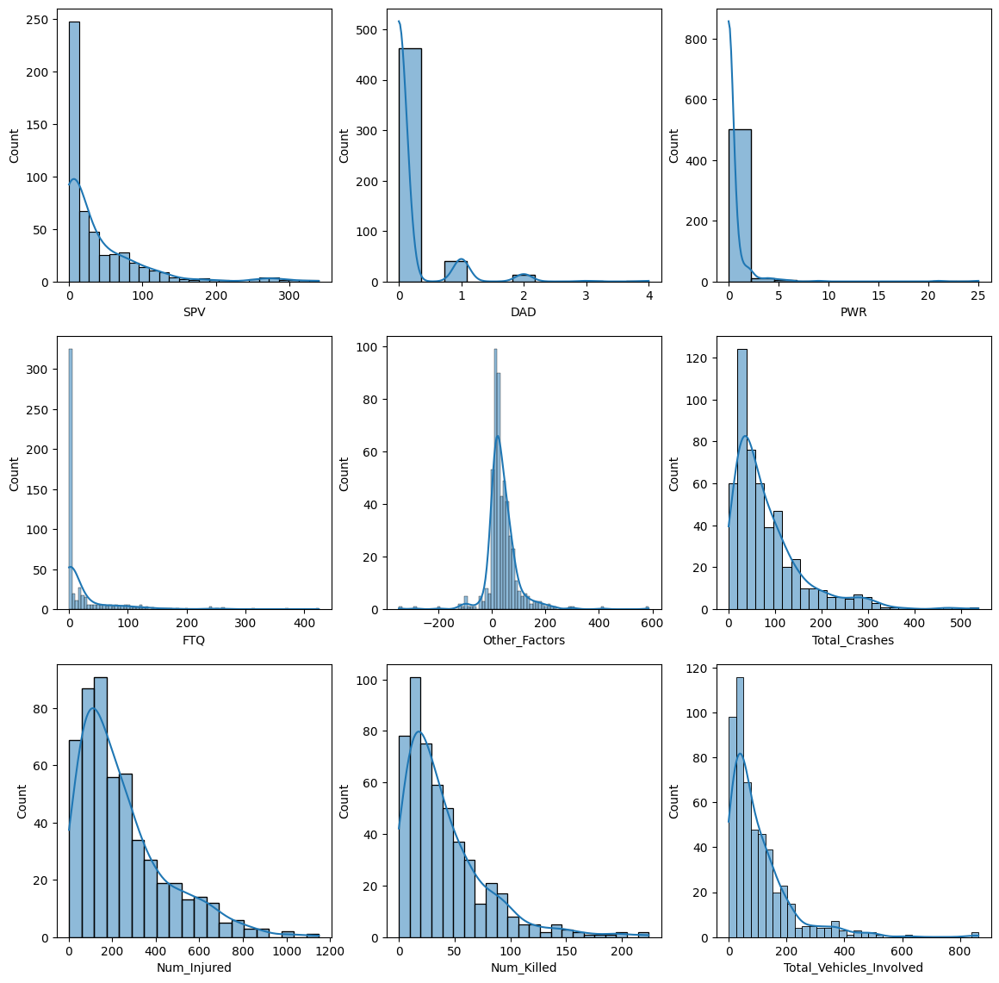

In [122]:
numerical_cols = [col for col in df.columns if df[col].dtype != 'object']
fig, ax = plt.subplots(3, 3, figsize=(14, 14))
for c in numerical_cols:
  sns.histplot(df[c], ax=ax[numerical_cols.index(c) // 3, numerical_cols.index(c) % 3], kde=True)
plt.show()

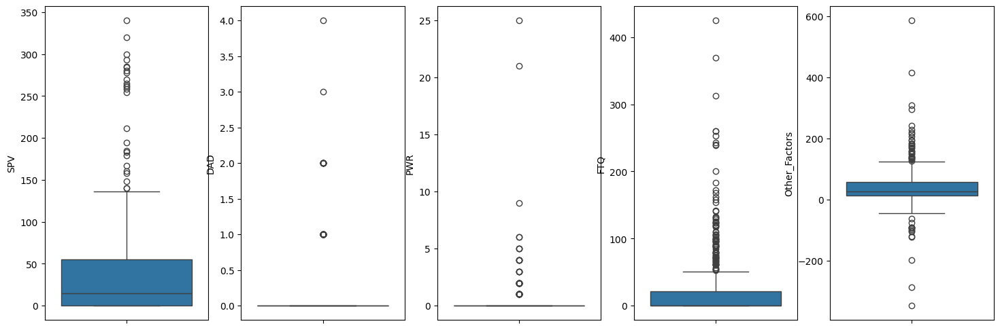

In [123]:
factors = ['SPV', "DAD", "PWR", "FTQ", 'Other_Factors']
fig, ax = plt.subplots(1, 5, figsize=(18, 6))
for c in factors:
  sns.boxplot(df[c], ax=ax[factors.index(c)])
plt.show()

***In General: the importance of each factor is as follow***
- **SPV** factor has high impact (i.e speed violation causes alot of crashes)
- **DAD** factor has low effect (i.e drugs are not a huge reason for crashes)
- **PWR** factor is a rare factor (i.e weather not common to cause a crash)
- **FTQ** factor should be taken in consideration.

## 2. Categorical columns

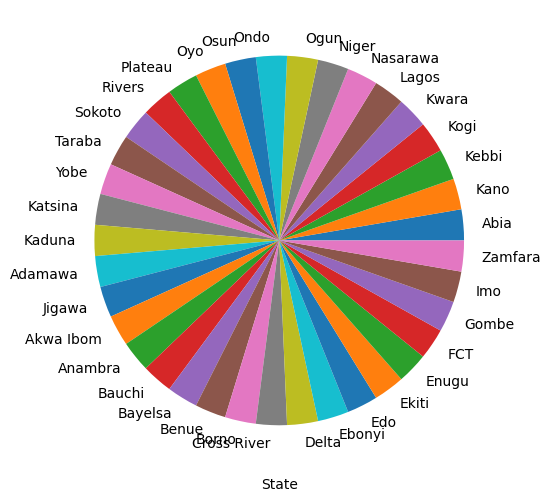

In [124]:
fig, ax = plt.subplots(figsize=(16, 6))
# define Seaborn color palette to use
ax.pie(df['State'].value_counts(), labels=df['State'].value_counts().index)
ax.set_xlabel('State')
plt.show()

***Conclusion:***
- Our sample Data has been collected equally from all states for all quraters ... so it's fare.

# KEY INSIGHTS

## Overall Trend through Time

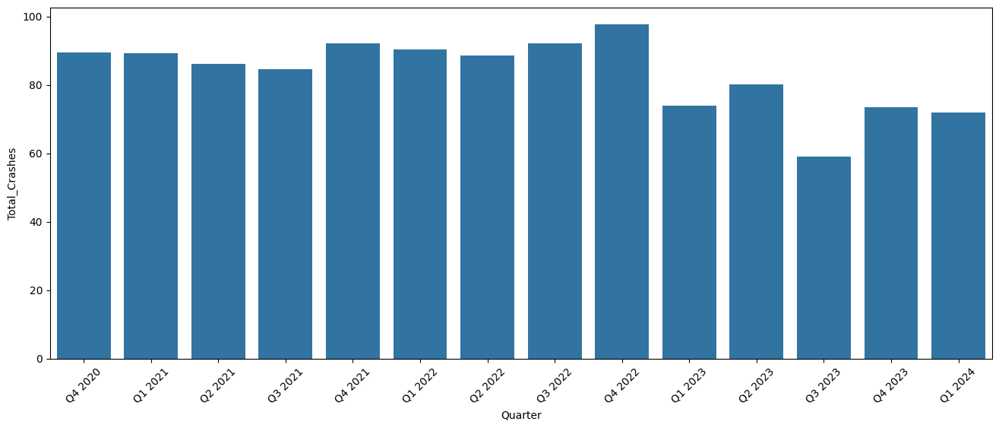

In [125]:
fig, ax = plt.subplots(figsize=(16, 6))
sns.barplot(data=df, x='Quarter', y='Total_Crashes', errorbar=None)
ax.tick_params(axis='x', rotation=45)
plt.show()

*The **Total Crashes** Tend to **decrease** in the recent year*

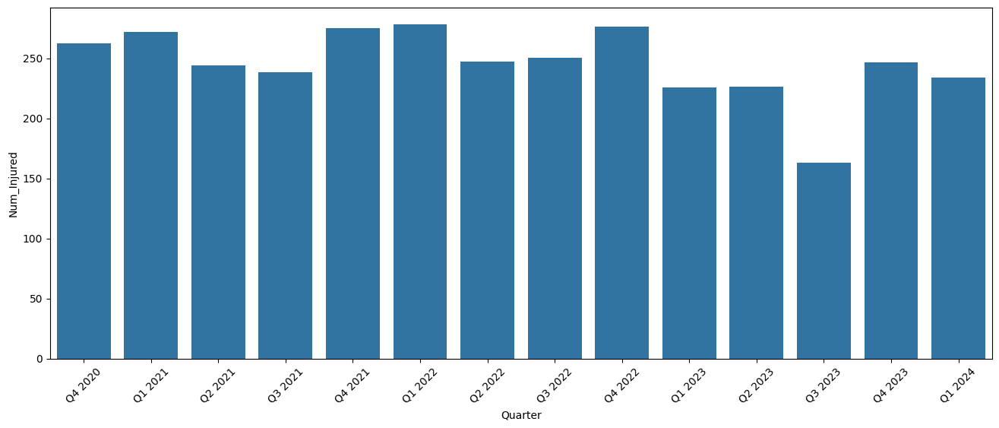

In [126]:
fig, ax = plt.subplots(figsize=(16, 6))
sns.barplot(data=df, x='Quarter', y='Num_Injured', errorbar=None)
ax.tick_params(axis='x', rotation=45)
plt.show()

*The **Total Injuries** Tend to **decrease** in the recent year*

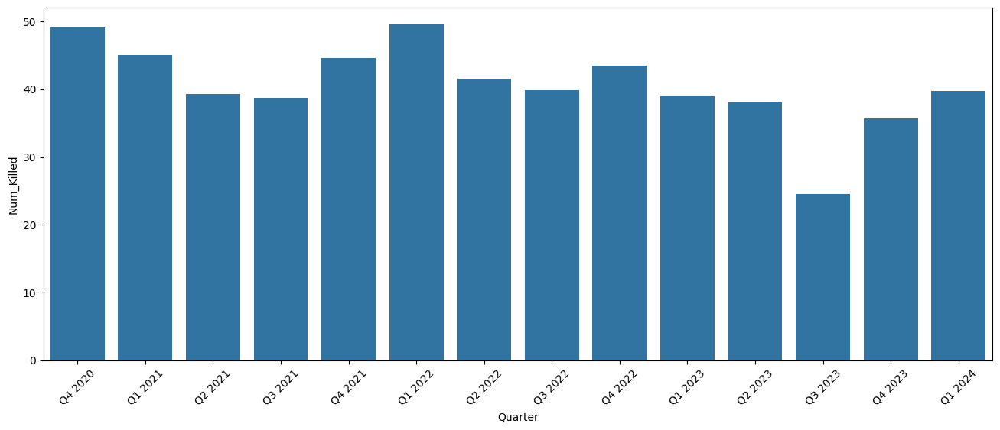

In [127]:
fig, ax = plt.subplots(figsize=(16, 6))
sns.barplot(data=df, x='Quarter', y='Num_Killed', errorbar=None)
ax.tick_params(axis='x', rotation=45)
plt.show()

*The **Total Kills** Tend to **decrease** in the recent year*

## 1. State by State


### 1.1 Number of Crashes

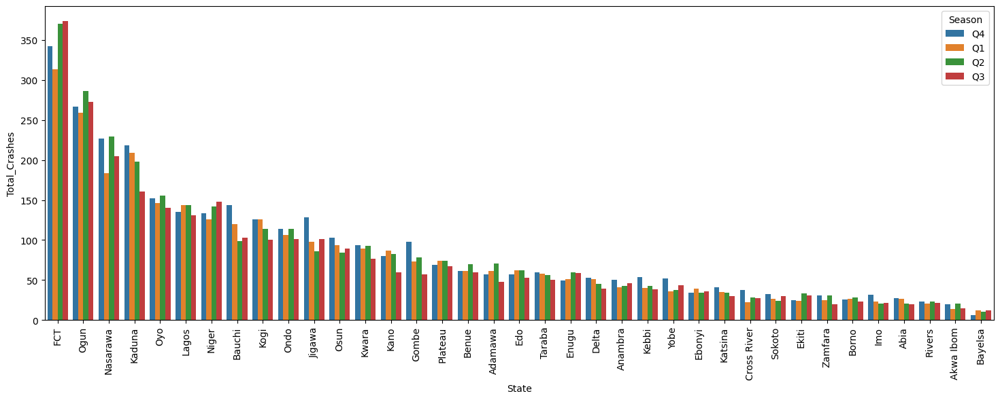

In [128]:
fig, ax = plt.subplots(figsize=(18, 6))
# show states oredered from highest to lowest
sns.barplot(data=df, x='State', y='Total_Crashes', hue='Season', errorbar=None, order=df.groupby('State').Total_Crashes.sum().sort_values(ascending=False).index)
ax.tick_params(axis='x', rotation=90)
plt.show()

*Huge **Variance** from State to another*\
'FCT --> Ogun --> Nasarawa --> Kaduna' has highest rate\
'Bayelsa' has lowest rate

###1.2. Number of Injuries

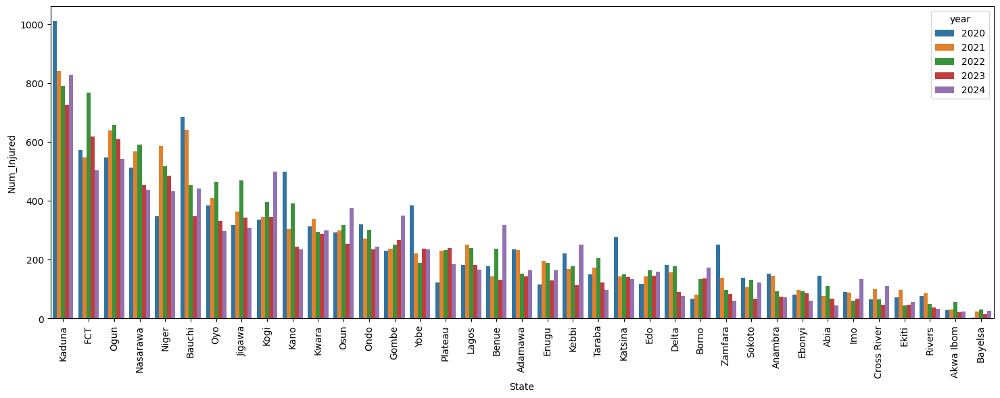

In [129]:
fig, ax = plt.subplots(figsize=(18, 6))
# show states oredered from highest to lowest
sns.barplot(data=df, x='State', y='Num_Injured', hue='year', errorbar=None, order=df.groupby('State').Num_Injured.sum().sort_values(ascending=False).index)
ax.tick_params(axis='x', rotation=90)
plt.show()

###1.3. Number of Killed

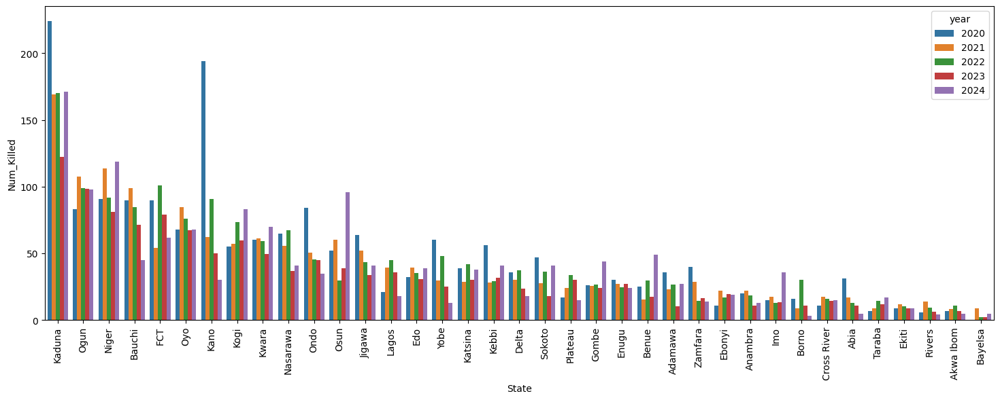

In [130]:
fig, ax = plt.subplots(figsize=(18, 6))
# show states oredered from highest to lowest
sns.barplot(data=df, x='State', y='Num_Killed', hue='year', errorbar=None, order=df.groupby('State').Num_Killed.sum().sort_values(ascending=False).index)
ax.tick_params(axis='x', rotation=90)
plt.show()

###1.4. Viechles_involved

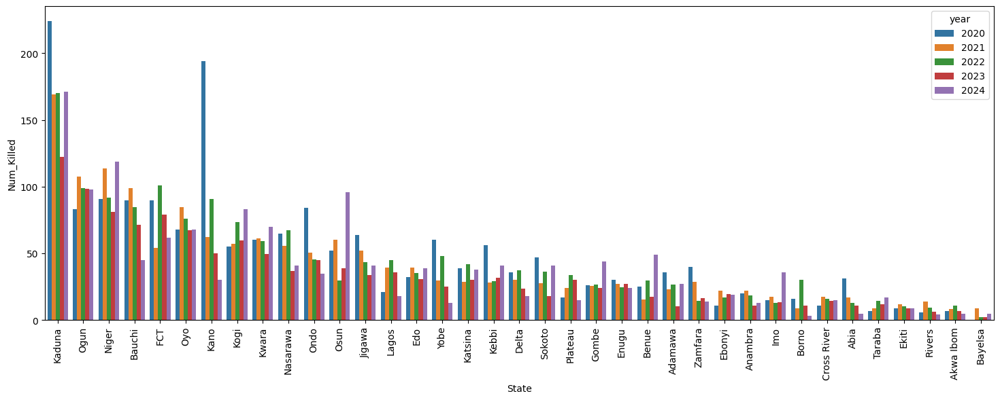

In [131]:
fig, ax = plt.subplots(figsize=(18, 6))
# show states oredered from highest to lowest
sns.barplot(data=df, x='State', y='Num_Killed', hue='year', errorbar=None, order=df.groupby('State').Num_Killed.sum().sort_values(ascending=False).index)
ax.tick_params(axis='x', rotation=90)
plt.show()

##2. Trend Analysis by Quarter and Year:

In [132]:
states_df = df.groupby('State')
states_df

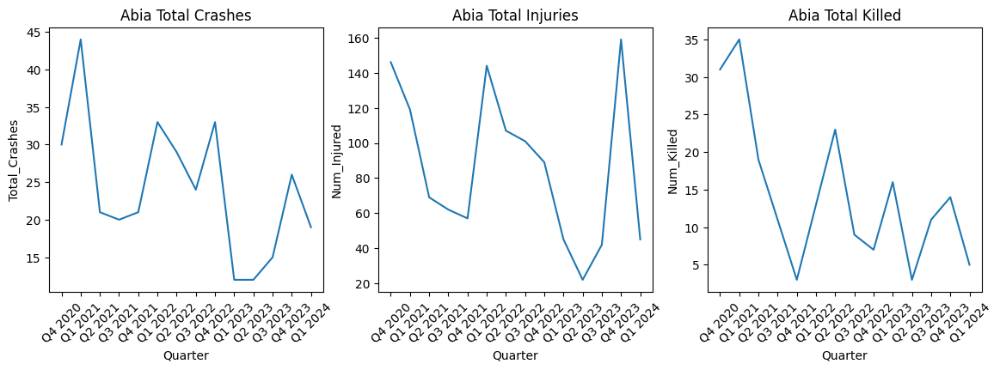

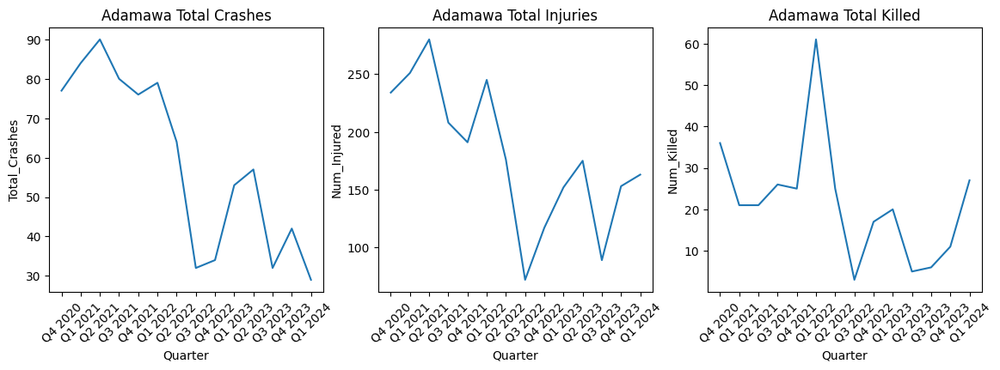

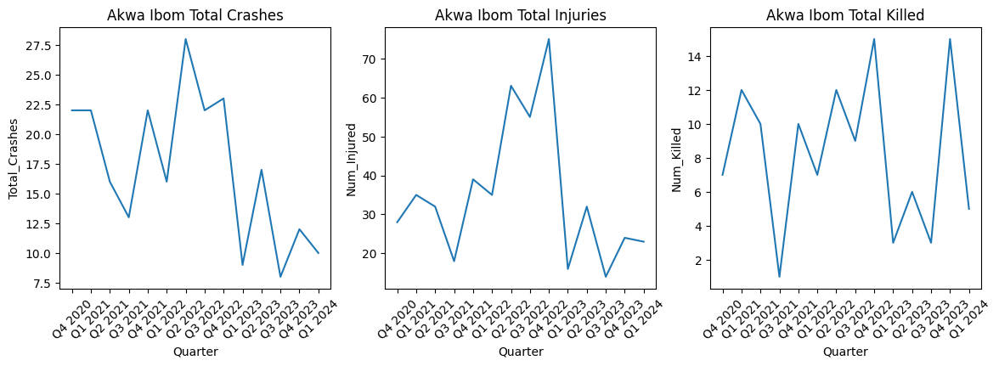

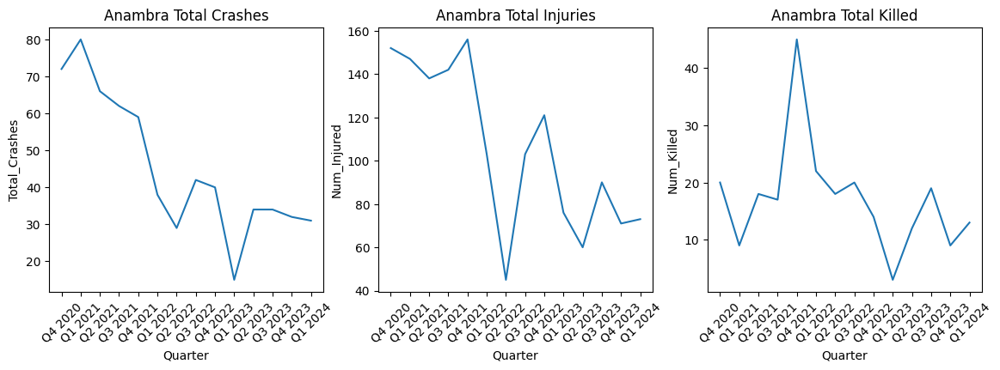

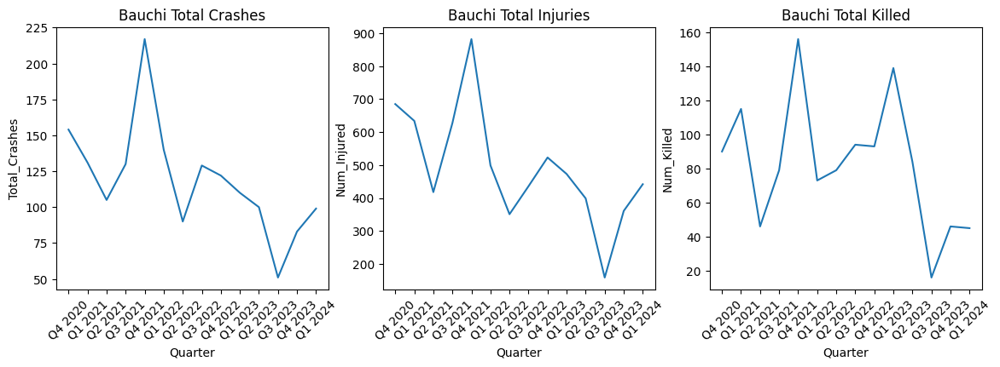

...

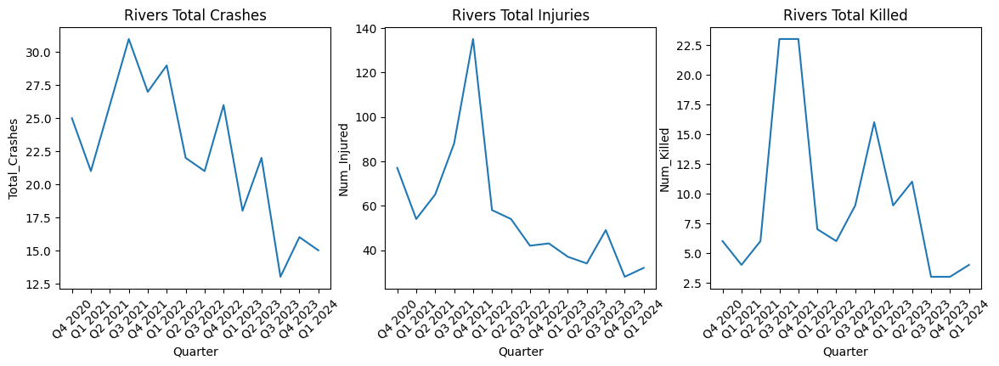

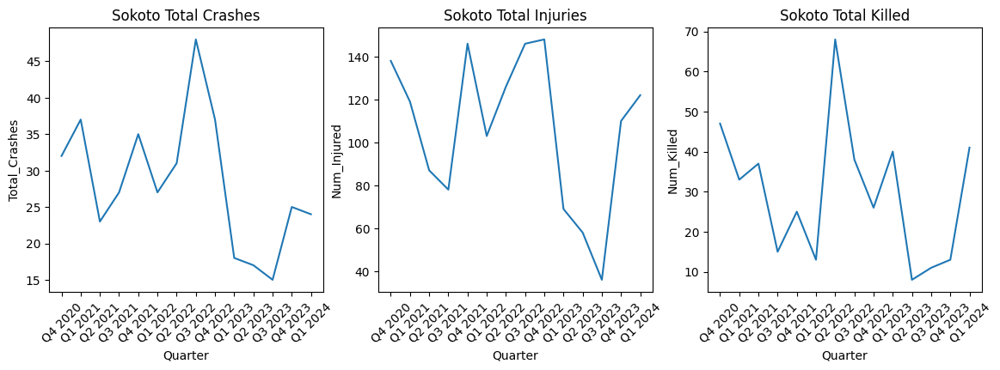

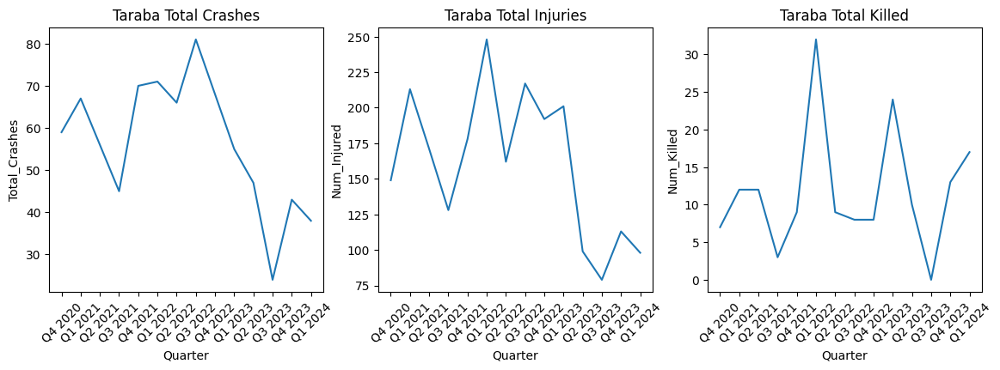

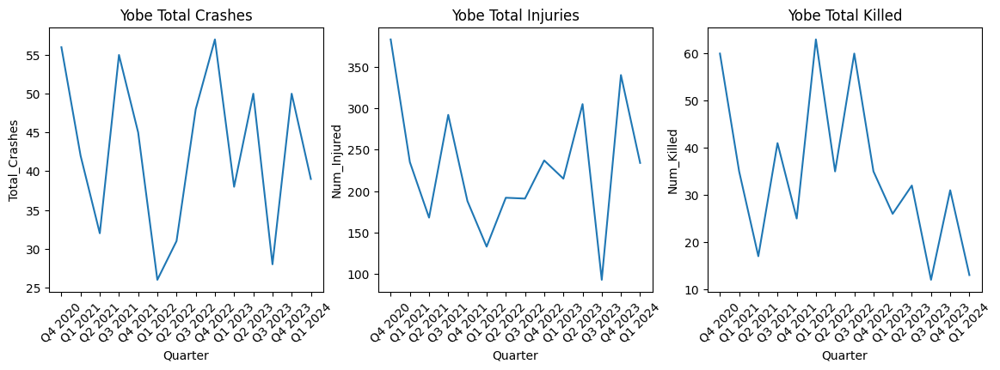

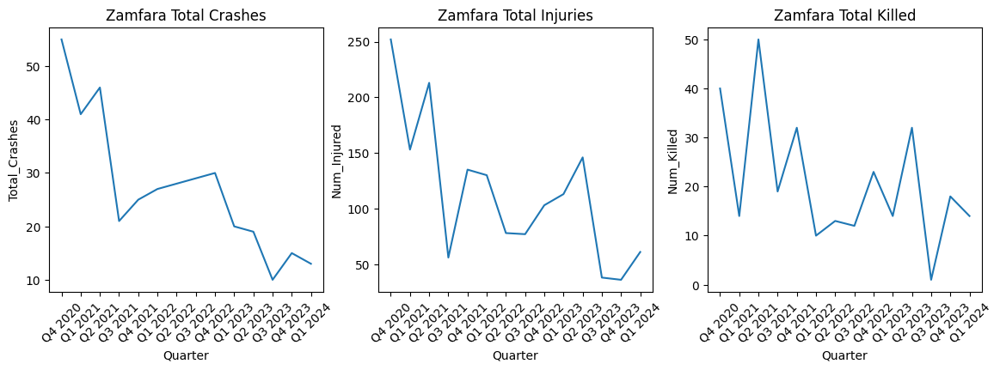

In [133]:
# for each state plot line plot across the years
for state, sub_df in states_df:
  fig, ax = plt.subplots(1, 3, figsize=(14,4))
  sns.lineplot(data=sub_df, x='Quarter', y='Total_Crashes', ax=ax[0])
  sns.lineplot(data=sub_df, x='Quarter', y='Num_Injured', ax=ax[1])
  sns.lineplot(data=sub_df, x='Quarter', y='Num_Killed', ax=ax[2])
  ax[0].set_title(f'{state} Total Crashes')
  ax[1].set_title(f'{state} Total Injuries')
  ax[2].set_title(f'{state} Total Killed')
  ax[0].tick_params(axis='x', rotation=45)
  ax[1].tick_params(axis='x', rotation=45)
  ax[2].tick_params(axis='x', rotation=45)
  plt.show()

Conclusion:
* some states have same frequency of Total Crashes hence (Injuries & Kills)
* other states have increasing trend
* others have decreasing trend

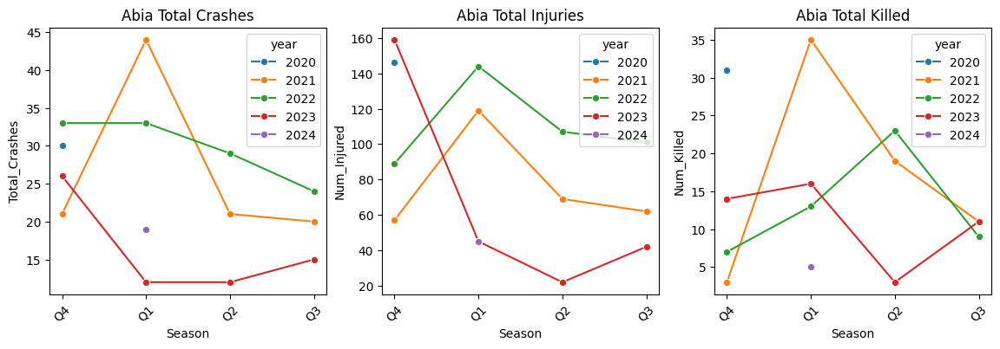

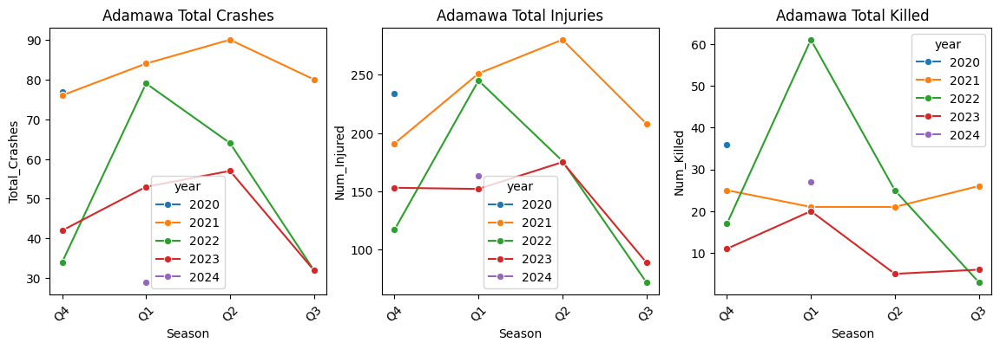

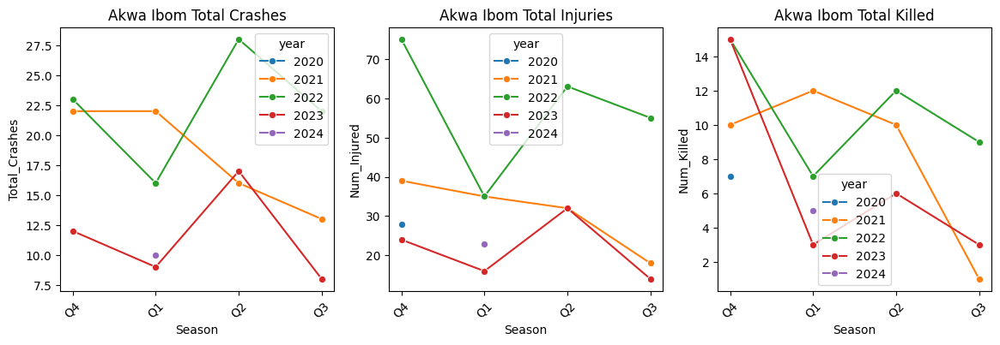

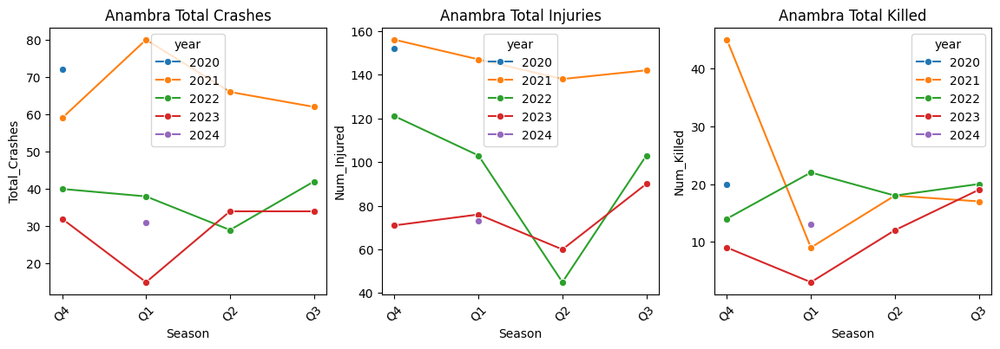

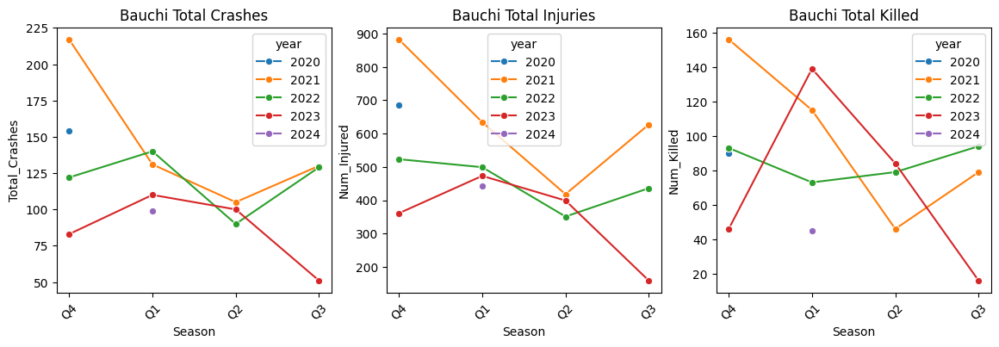

...

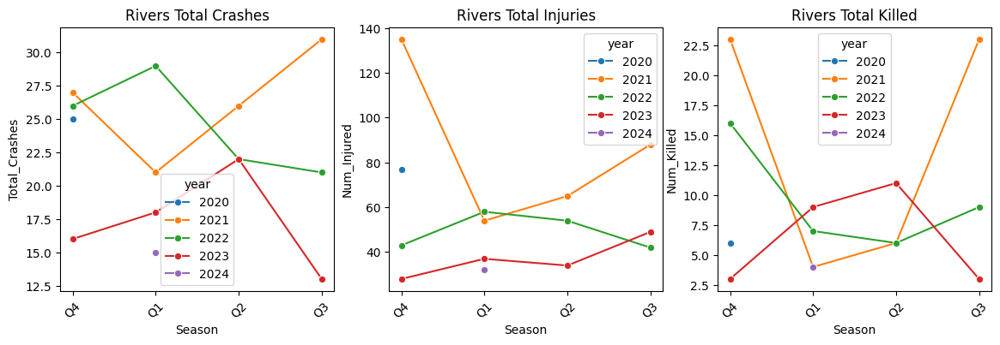

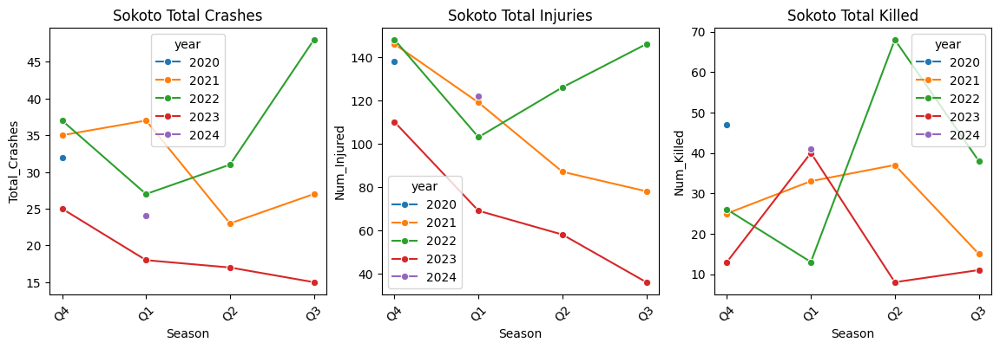

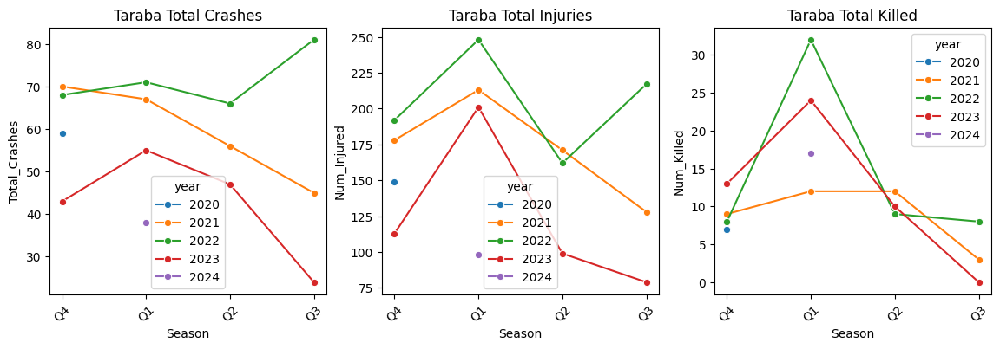

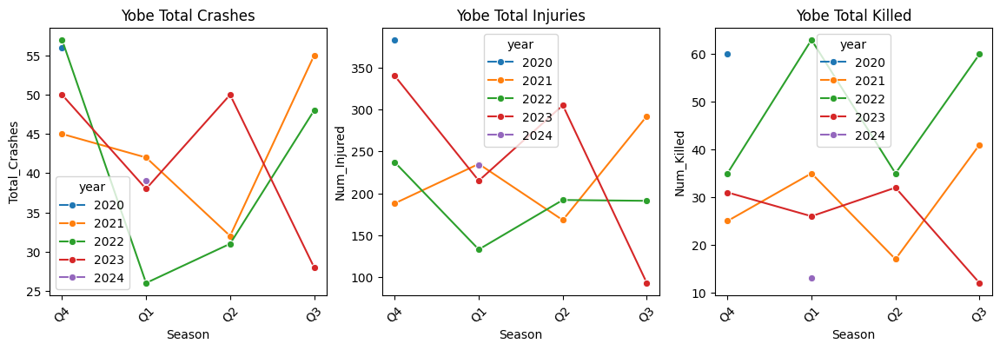

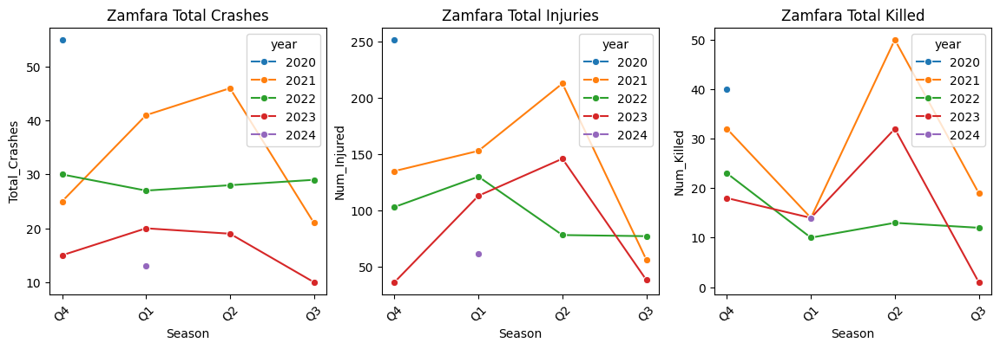

In [134]:
for state, sub_df in states_df:
  fig, ax = plt.subplots(1, 3, figsize=(14,4))
  sns.lineplot(data=sub_df, x='Season', y='Total_Crashes', ax=ax[0], hue='year', marker='o')
  sns.lineplot(data=sub_df, x='Season', y='Num_Injured', ax=ax[1], hue='year', marker='o')
  sns.lineplot(data=sub_df, x='Season', y='Num_Killed', ax=ax[2], hue='year', marker='o')
  ax[0].set_title(f'{state} Total Crashes')
  ax[1].set_title(f'{state} Total Injuries')
  ax[2].set_title(f'{state} Total Killed')
  ax[0].tick_params(axis='x', rotation=45)
  ax[1].tick_params(axis='x', rotation=45)
  ax[2].tick_params(axis='x', rotation=45)
  plt.show()

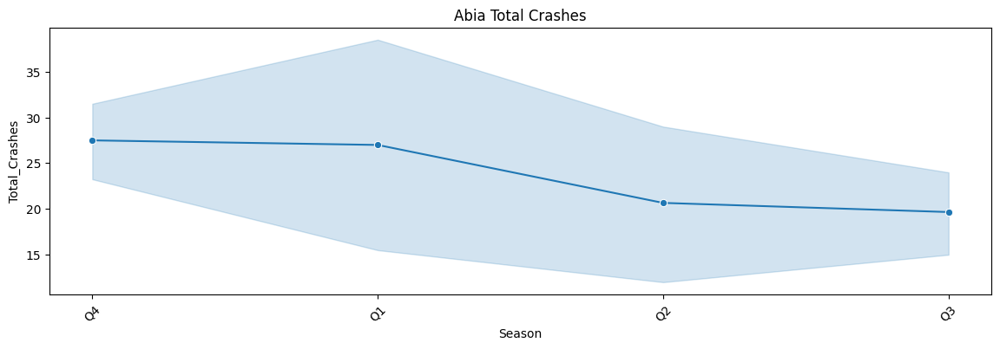

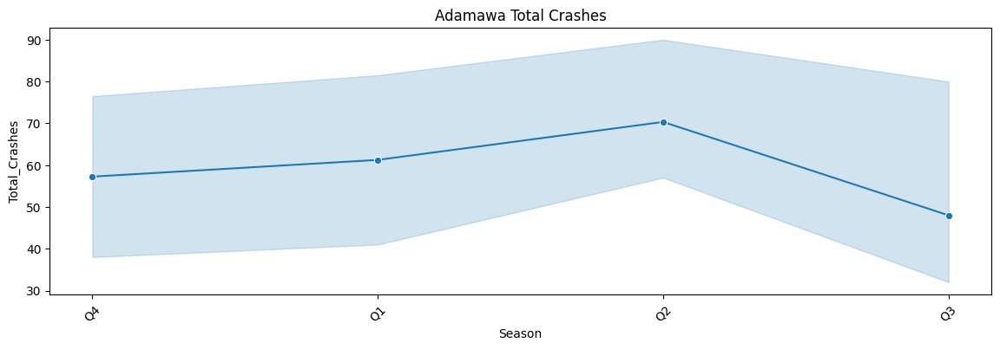

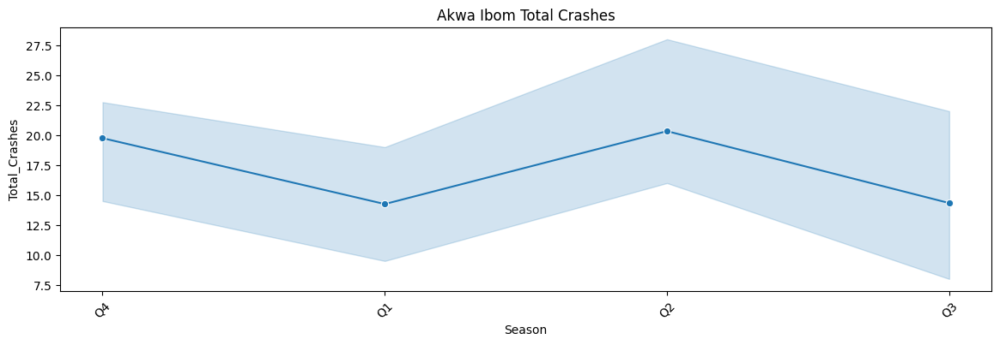

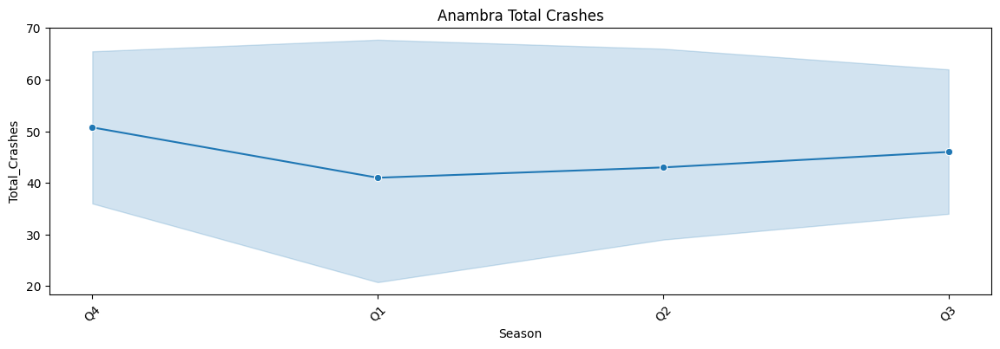

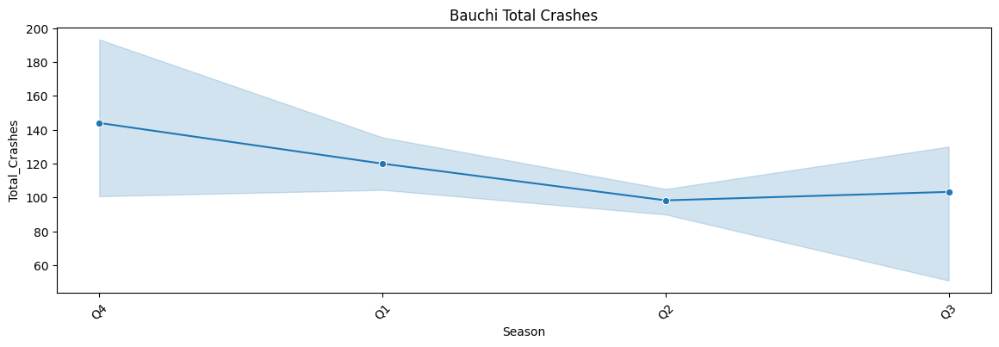

...

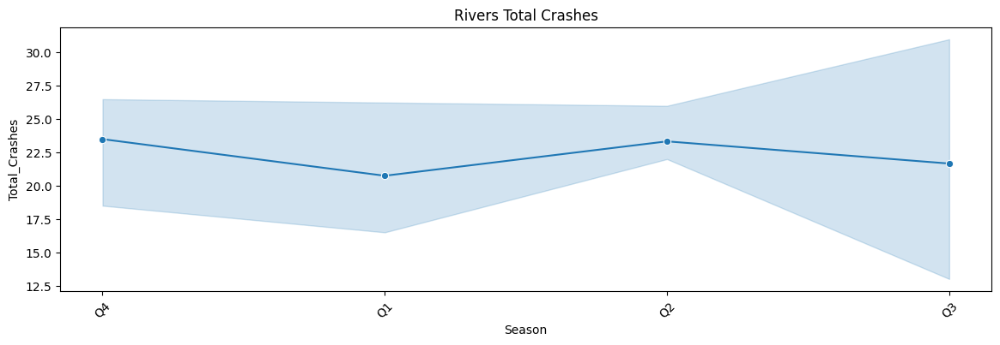

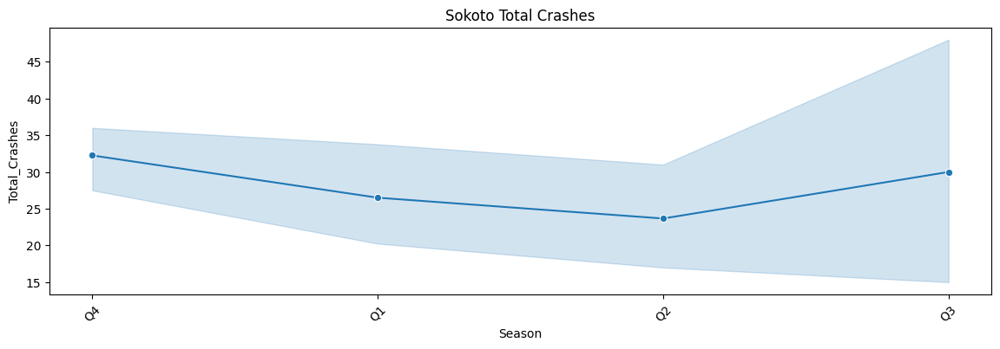

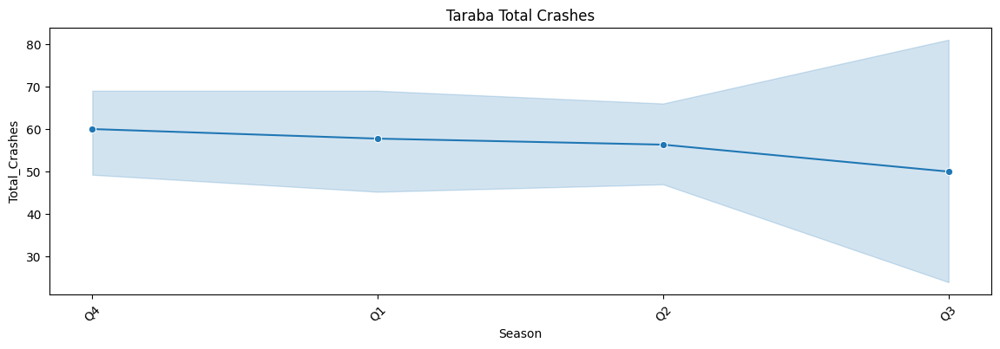

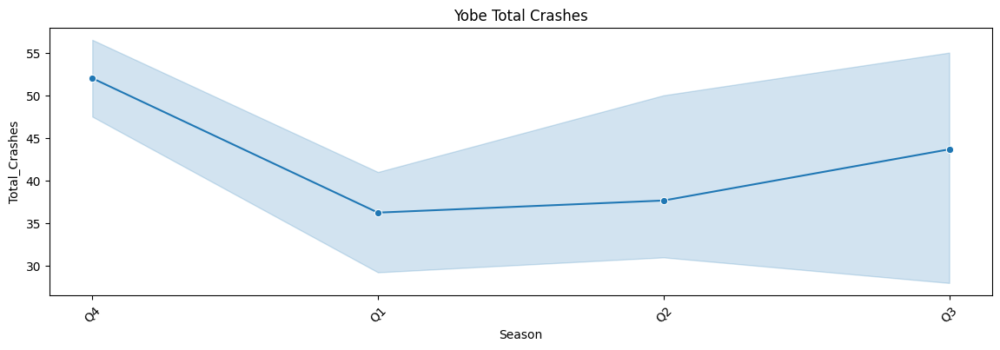

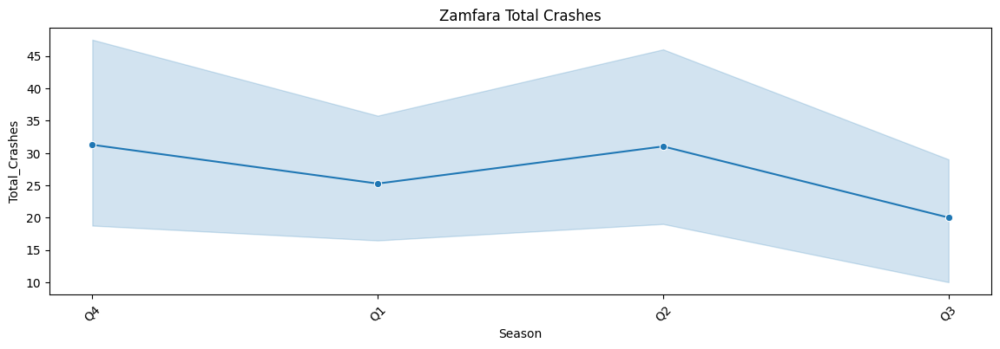

In [135]:
for state, sub_df in states_df:
  fig, ax = plt.subplots(figsize=(14,4))
  sns.lineplot(data=sub_df, x='Season', y='Total_Crashes', marker='o')
  ax.set_title(f'{state} Total Crashes')
  ax.tick_params(axis='x', rotation=45)
  plt.show()

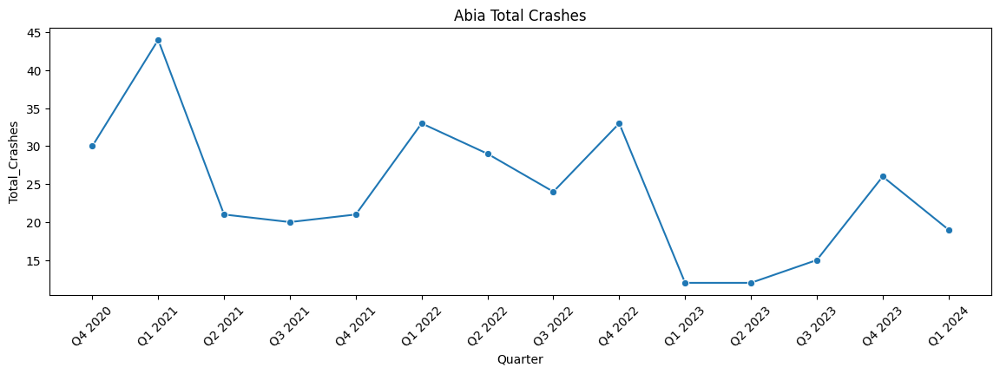

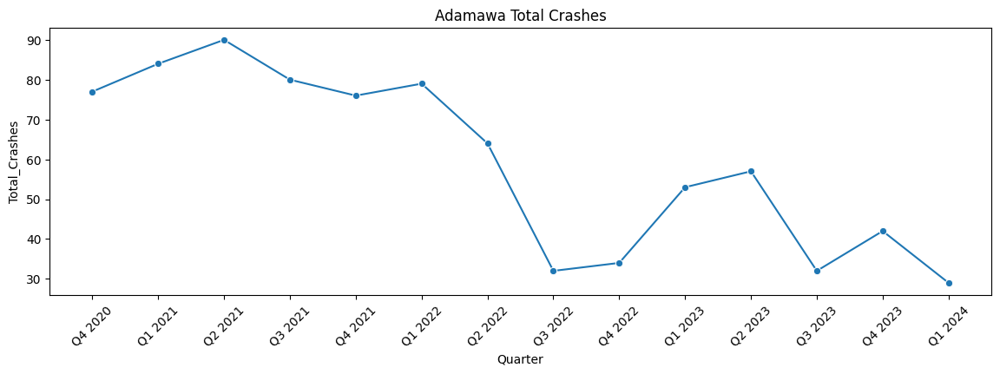

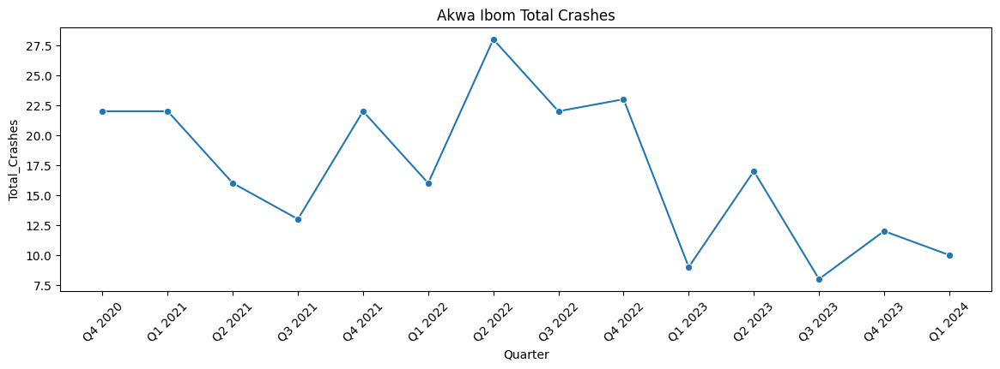

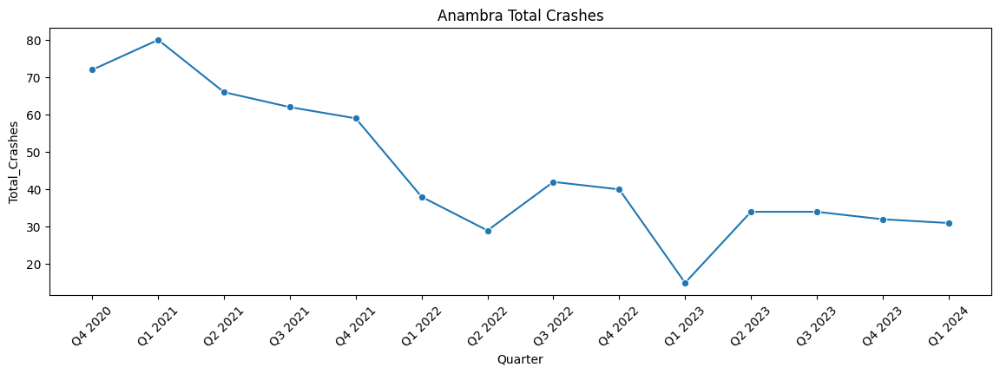

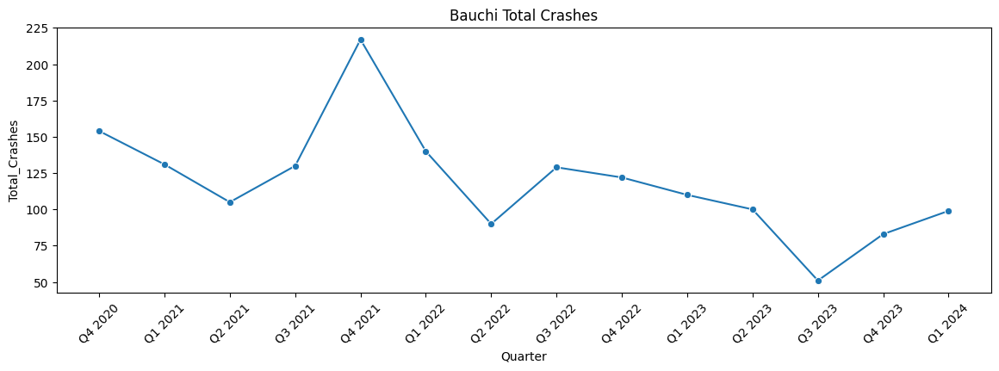

...

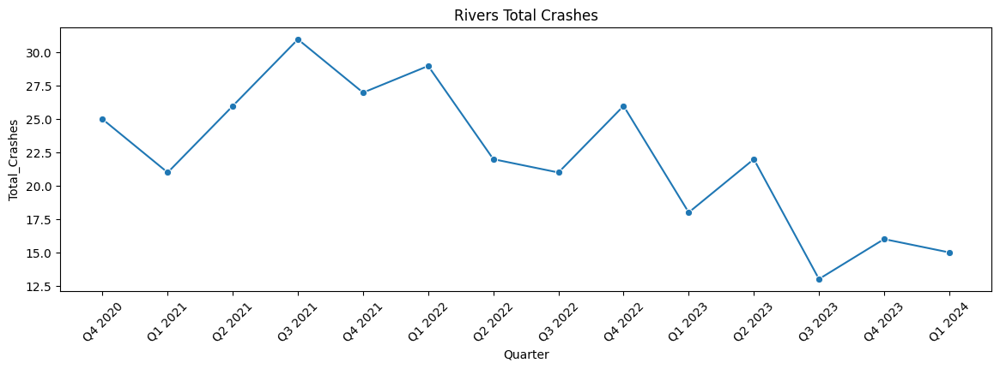

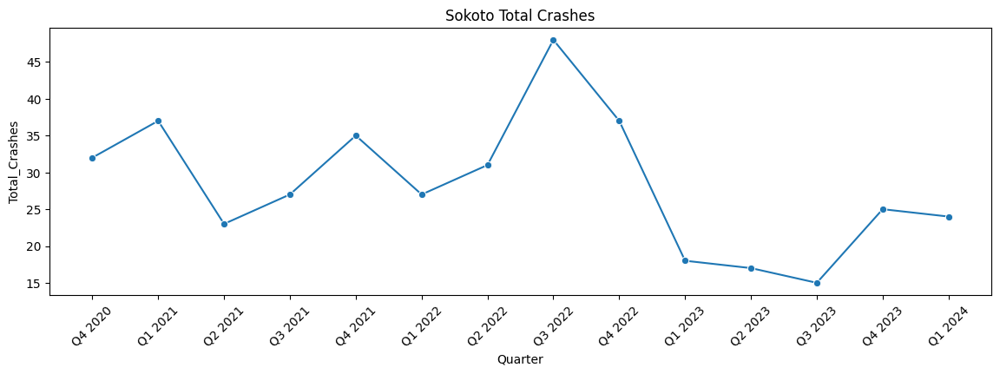

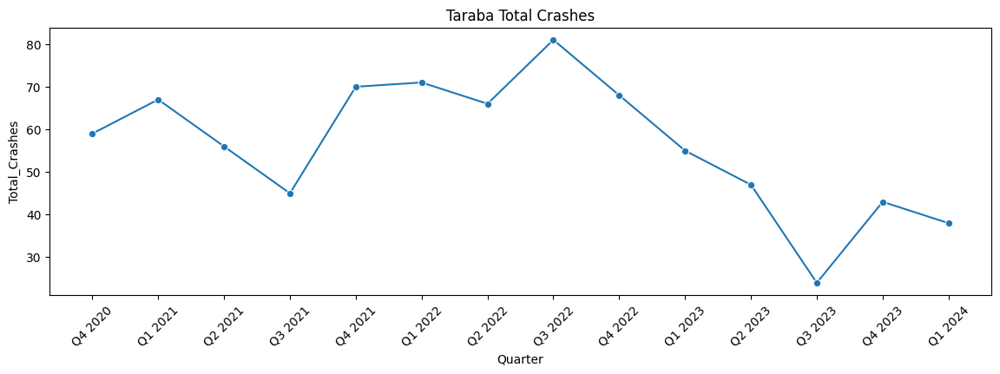

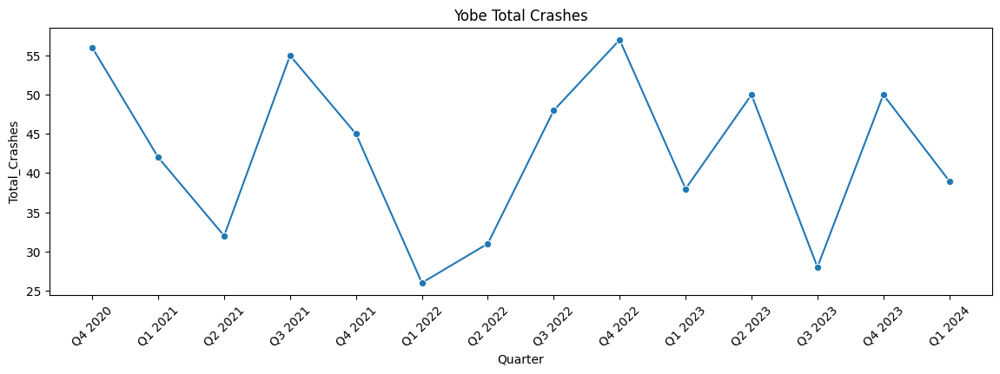

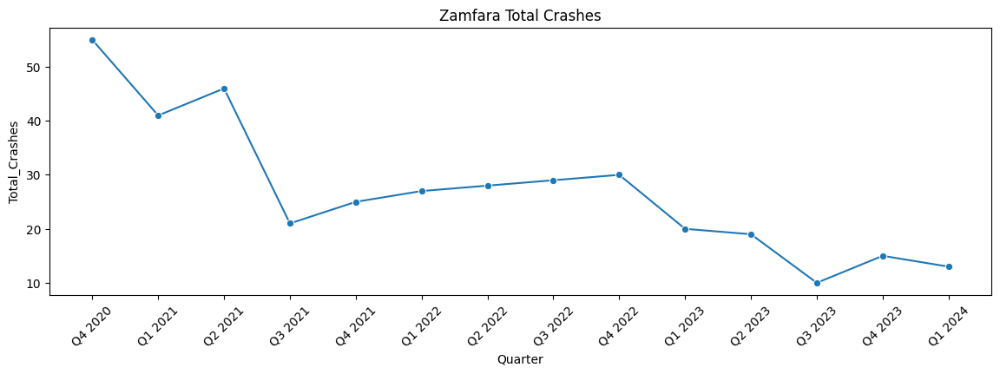

In [136]:
for state, sub_df in states_df:
  fig, ax = plt.subplots(figsize=(14,4))
  sns.lineplot(data=sub_df, x='Quarter', y='Total_Crashes', marker='o')
  ax.set_title(f'{state} Total Crashes')
  ax.tick_params(axis='x', rotation=45)
  plt.show()

##3. Impact of Crash Factors:

### For each State, what is the coorelation between (SPV, DAD, PWR, FTQ, other) factors and the (Total_Crashes, Num_Injured, Num_Killed) results


### 3.1. SPV

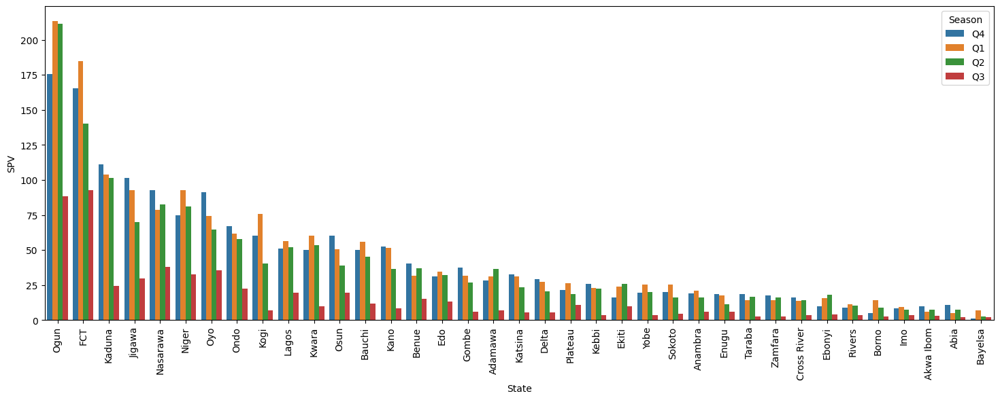

In [137]:
fig, ax = plt.subplots(figsize=(18, 6))
sns.barplot(data=df, x='State', y='SPV', hue='Season', errorbar=None, order=df.groupby('State').SPV.sum().sort_values(ascending=False).index)
ax.tick_params(axis='x', rotation=90)
plt.show()

Ogun has highest probability of crashes due to (speed violation)

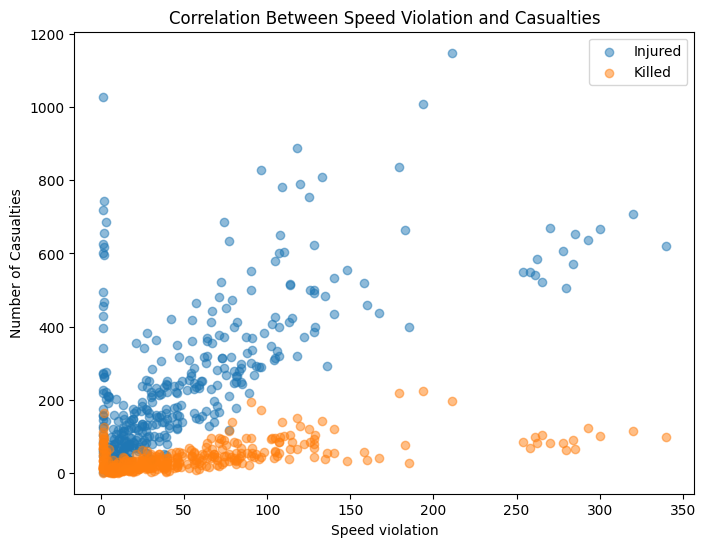

In [138]:
SPV_df = df[df['SPV'] > 0]
plt.figure(figsize=(8, 6))
plt.scatter(SPV_df['SPV'], SPV_df['Num_Injured'], alpha=0.5, label='Injured')
plt.scatter(SPV_df['SPV'], SPV_df['Num_Killed'], alpha=0.5, label='Killed')
plt.xlabel('Speed violation')
plt.ylabel('Number of Casualties')
plt.title('Correlation Between Speed Violation and Casualties')
plt.legend()
plt.show()

### 3.2. DAD

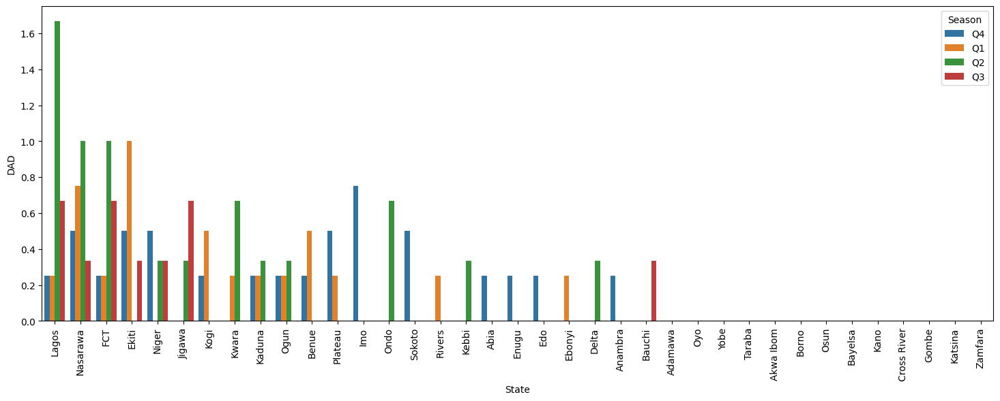

In [139]:
fig, ax = plt.subplots(figsize=(18, 6))
sns.barplot(data=df, x='State', y='DAD', hue='Season', errorbar=None, order=df.groupby('State').DAD.sum().sort_values(ascending=False).index)
ax.tick_params(axis='x', rotation=90)
plt.show()

Lagos has highest probability of crashes due to (drugs)

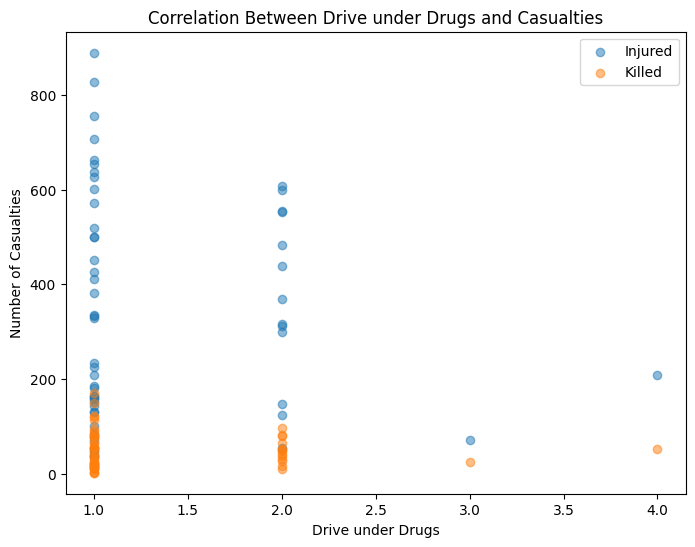

In [140]:
DAD_df = df[df['DAD'] > 0]
plt.figure(figsize=(8, 6))
plt.scatter(DAD_df['DAD'], DAD_df['Num_Injured'], alpha=0.5, label='Injured')
plt.scatter(DAD_df['DAD'], DAD_df['Num_Killed'], alpha=0.5, label='Killed')
plt.xlabel('Drive under Drugs')
plt.ylabel('Number of Casualties')
plt.title('Correlation Between Drive under Drugs and Casualties')
plt.legend()
plt.show()

### 3.3. PWR

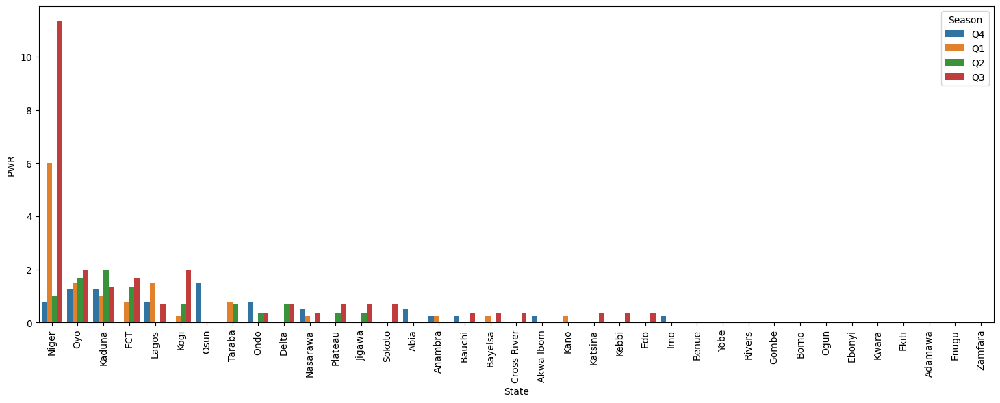

In [141]:
fig, ax = plt.subplots(figsize=(18, 6))
sns.barplot(data=df, x='State', y='PWR', hue='Season', errorbar=None, order=df.groupby('State').PWR.sum().sort_values(ascending=False).index)
ax.tick_params(axis='x', rotation=90)
plt.show()

Niger has highest probability in accidents caused by Bad Weather

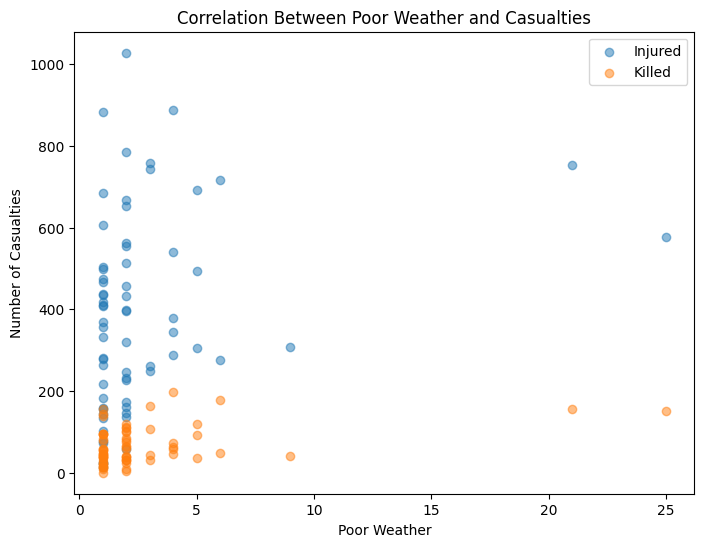

In [142]:
PWR_df = df[df['PWR'] > 0]
plt.figure(figsize=(8, 6))
plt.scatter(PWR_df['PWR'], PWR_df['Num_Injured'], alpha=0.5, label='Injured')
plt.scatter(PWR_df['PWR'], PWR_df['Num_Killed'], alpha=0.5, label='Killed')
plt.xlabel('Poor Weather')
plt.ylabel('Number of Casualties')
plt.title('Correlation Between Poor Weather and Casualties')
plt.legend()
plt.show()

### 3.4. FTQ

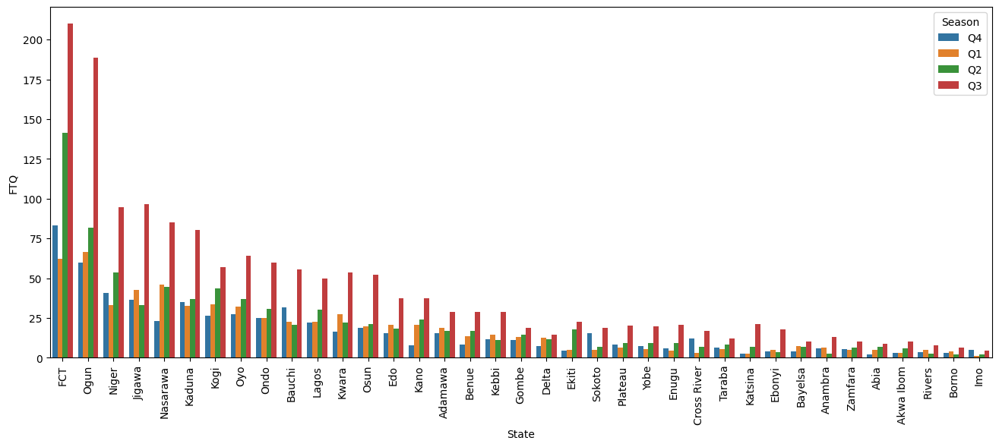

In [143]:
fig, ax = plt.subplots(figsize=(16, 6))
sns.barplot(data=df, x='State', y='FTQ', hue='Season', errorbar=None, order=df.groupby('State').FTQ.sum().sort_values(ascending=False).index)
ax.tick_params(axis='x', rotation=90)
plt.show()

FCT has highest probability of crashes due to (fatigue)

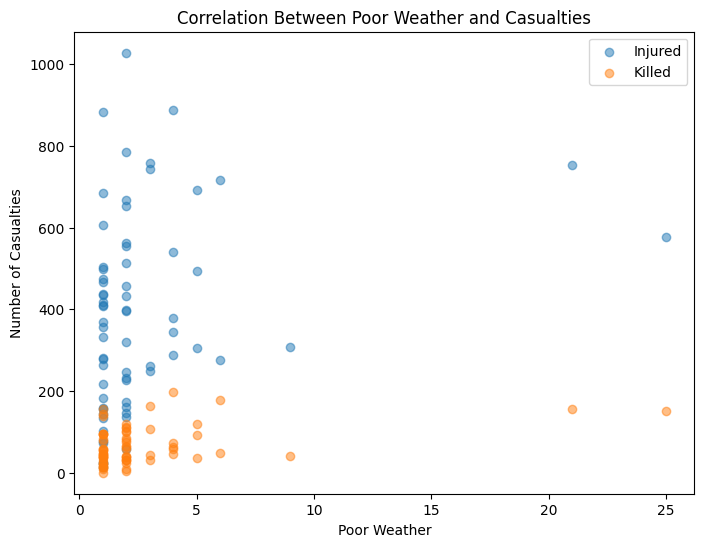

In [144]:
FTQ_df = df[df['PWR'] > 0]
plt.figure(figsize=(8, 6))
plt.scatter(FTQ_df['PWR'], FTQ_df['Num_Injured'], alpha=0.5, label='Injured')
plt.scatter(FTQ_df['PWR'], FTQ_df['Num_Killed'], alpha=0.5, label='Killed')
plt.xlabel('Poor Weather')
plt.ylabel('Number of Casualties')
plt.title('Correlation Between Poor Weather and Casualties')
plt.legend()
plt.show()

### 3.5. other factors

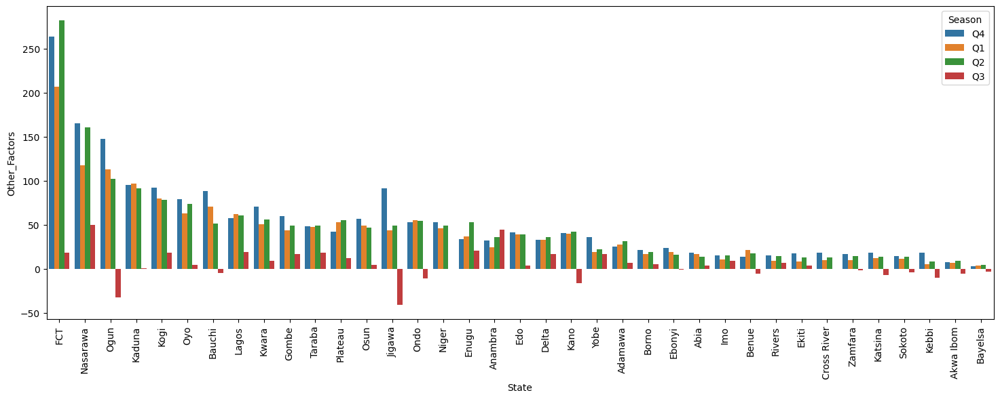

In [145]:
fig, ax = plt.subplots(figsize=(18, 6))
sns.barplot(data=df, x='State', y='Other_Factors', hue='Season', errorbar=None, order=df.groupby('State').Other_Factors.sum().sort_values(ascending=False).index)
ax.tick_params(axis='x', rotation=90)
plt.show()

### Injuries vs Factors

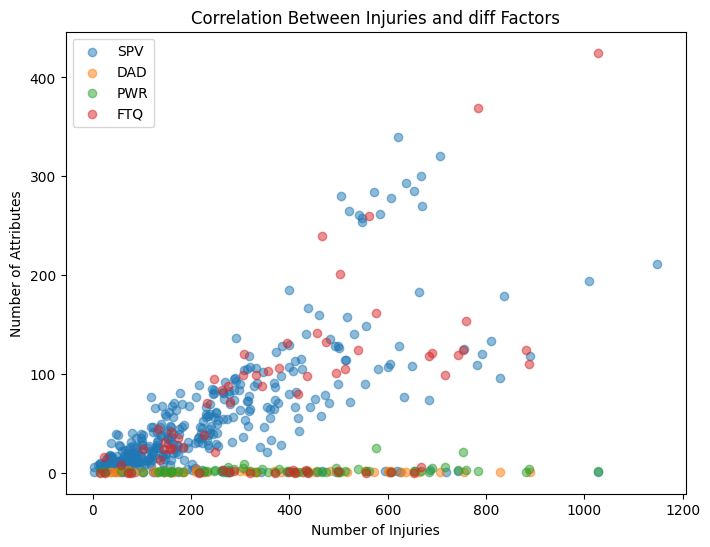

In [146]:
plt.figure(figsize=(8, 6))
plt.scatter(SPV_df['Num_Injured'], SPV_df['SPV'], alpha=0.5, label='SPV')
plt.scatter(DAD_df['Num_Injured'], DAD_df['DAD'], alpha=0.5, label='DAD')
plt.scatter(PWR_df['Num_Injured'], PWR_df['PWR'], alpha=0.5, label='PWR')
plt.scatter(FTQ_df['Num_Injured'], FTQ_df['FTQ'], alpha=0.5, label='FTQ')
plt.xlabel('Number of Injuries')
plt.ylabel('Number of Attributes')
plt.title('Correlation Between Injuries and diff Factors')
plt.legend()
plt.show()

### Kills vs Factors

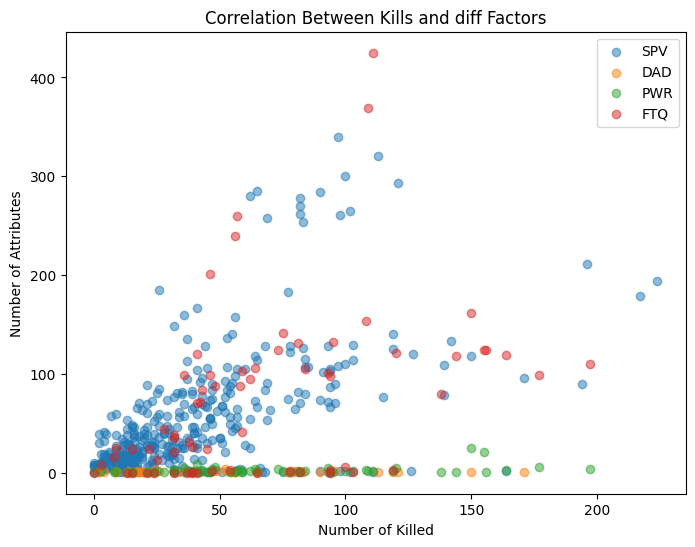

In [147]:
plt.figure(figsize=(8, 6))
plt.scatter(SPV_df['Num_Killed'], SPV_df['SPV'], alpha=0.5, label='SPV')
plt.scatter(DAD_df['Num_Killed'], DAD_df['DAD'], alpha=0.5, label='DAD')
plt.scatter(PWR_df['Num_Killed'], PWR_df['PWR'], alpha=0.5, label='PWR')
plt.scatter(FTQ_df['Num_Killed'], FTQ_df['FTQ'], alpha=0.5, label='FTQ')
plt.xlabel('Number of Killed')
plt.ylabel('Number of Attributes')
plt.title('Correlation Between Kills and diff Factors')
plt.legend()
plt.show()

### Total_vehicles_involved vs Causalities

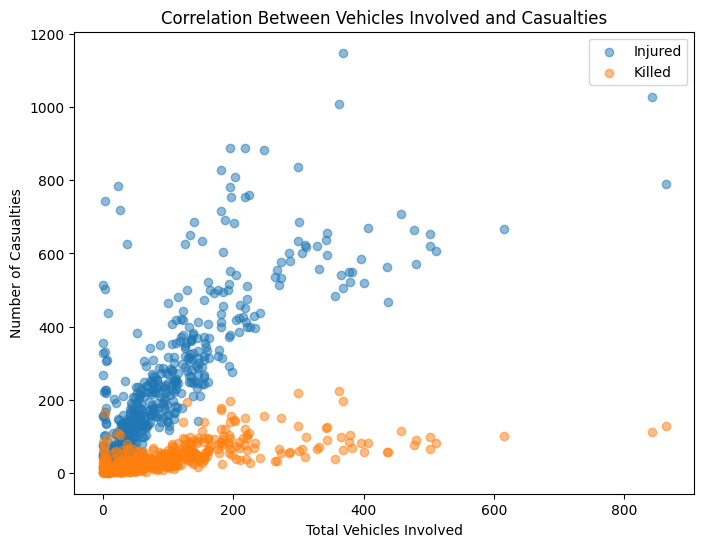

In [148]:
plt.figure(figsize=(8, 6))
plt.scatter(df['Total_Vehicles_Involved'], df['Num_Injured'], alpha=0.5, label='Injured')
plt.scatter(df['Total_Vehicles_Involved'], df['Num_Killed'], alpha=0.5, label='Killed')
plt.xlabel('Total Vehicles Involved')
plt.ylabel('Number of Casualties')
plt.title('Correlation Between Vehicles Involved and Casualties')
_ = plt.legend()

In [149]:
fig = px.sunburst(df, path=['year', 'Season', 'State'], values='Total_Crashes', title='sunburst chart')
fig.show()